### Import Libraries

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering

from scipy.spatial.distance import cdist

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy
from sklearn.cluster import KMeans
from sklearn.metrics import  silhouette_score


from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer

from sklearn.mixture import GaussianMixture

from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

#import hypertools as hyp
#from collections import Counter

'''Set plotting parameters'''
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv('Country-data.csv',low_memory=False)
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [30]:
df['exports'][0] * df['gdpp'][0] / 100

55.3

In [6]:
# describe data
print("--------------------------")
print("Describe:-----------------")
print(df.describe())
print("--------------------------")
print("Shape:--------------------")
print(df.shape)
print("--------------------------")
print("Is.Na---------------------")
print((df.isnull().sum() / len(df)) * 100)
print("--------------------------")
print("Info----------------------")
print(df.info(verbose=True))

--------------------------
Describe:-----------------
       child_mort     exports      health     imports         income  \
count  167.000000  167.000000  167.000000  167.000000     167.000000   
mean    38.270060   41.108976    6.815689   46.890215   17144.688623   
std     40.328931   27.412010    2.746837   24.209589   19278.067698   
min      2.600000    0.109000    1.810000    0.065900     609.000000   
25%      8.250000   23.800000    4.920000   30.200000    3355.000000   
50%     19.300000   35.000000    6.320000   43.300000    9960.000000   
75%     62.100000   51.350000    8.600000   58.750000   22800.000000   
max    208.000000  200.000000   17.900000  174.000000  125000.000000   

        inflation  life_expec   total_fer           gdpp  
count  167.000000  167.000000  167.000000     167.000000  
mean     7.781832   70.555689    2.947964   12964.155689  
std     10.570704    8.893172    1.513848   18328.704809  
min     -4.210000   32.100000    1.150000     231.000000  
25

In [5]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

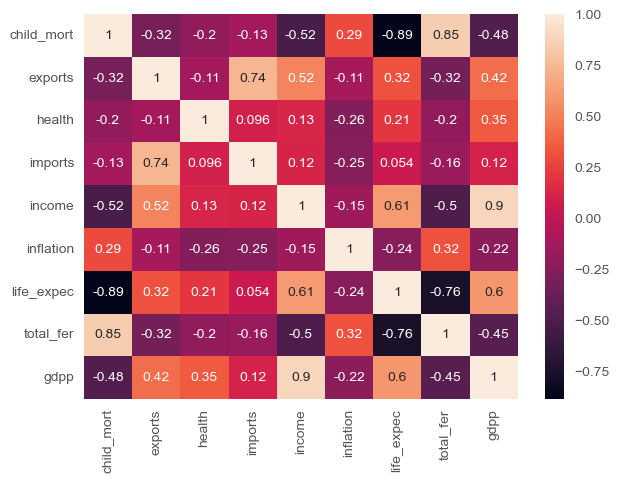

In [7]:
plt.figure(figsize=(7,5))
sns.heatmap(df.corr(),annot=True)
plt.show()

<Axes: >

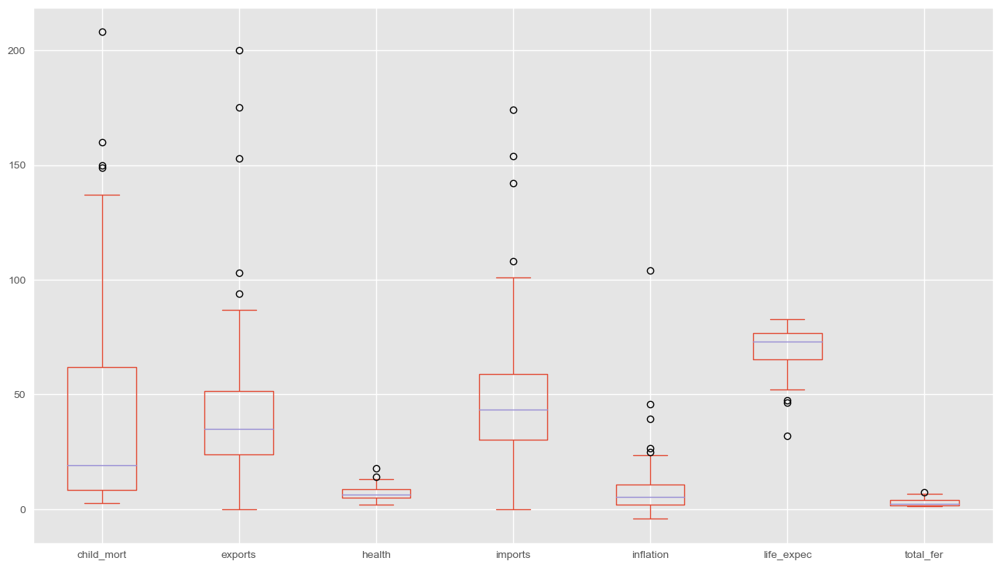

In [10]:
df.drop(['income','gdpp'],axis=1).plot(kind='box')

<Axes: >

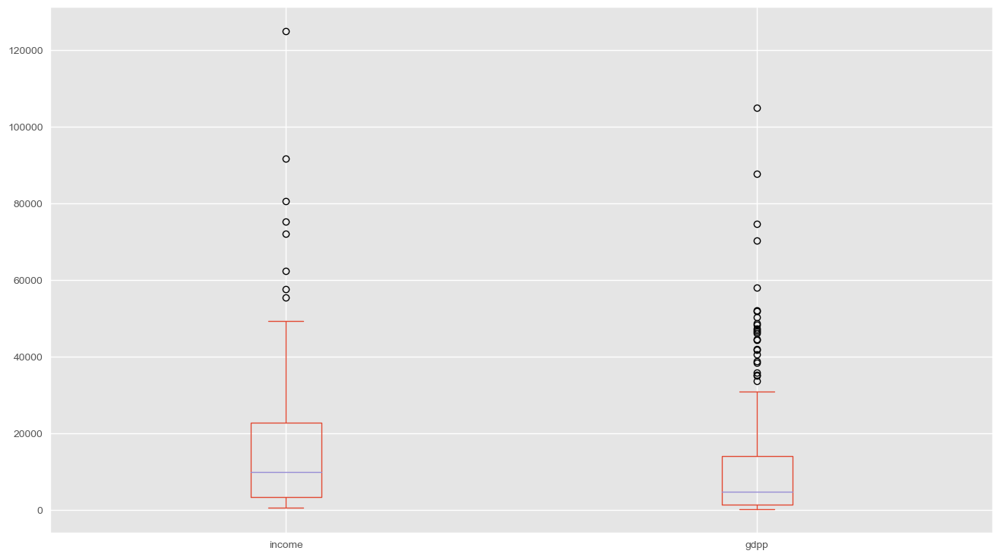

In [15]:
df[['income','gdpp']].plot(kind='box')

In [17]:
dfc = df.copy()

In [19]:
dfc.drop('income',axis=1,inplace=True)

In [20]:
dfc['exports'] * df['gdpp'] / 100
dfc['imports'] * df['gdpp'] / 100
dfc['health']  * df['gdpp'] / 100

0       41.9174
1      267.8950
2      185.9820
3      100.6050
4      735.6600
         ...   
162    155.9250
163    662.8500
164     89.6040
165     67.8580
166     85.9940
Length: 167, dtype: float64

In [5]:
for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df,
                        locationmode='country names',
                        locations='country',
                        hover_name='country',
                         title=i+' per country (World)',color=i,
                        color_continuous_scale=px.colors.sequential.Plasma,
                         projection='natural earth'
                       )
    #fig.write_html(f"Interactive-plots_World_{i}.html")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show()

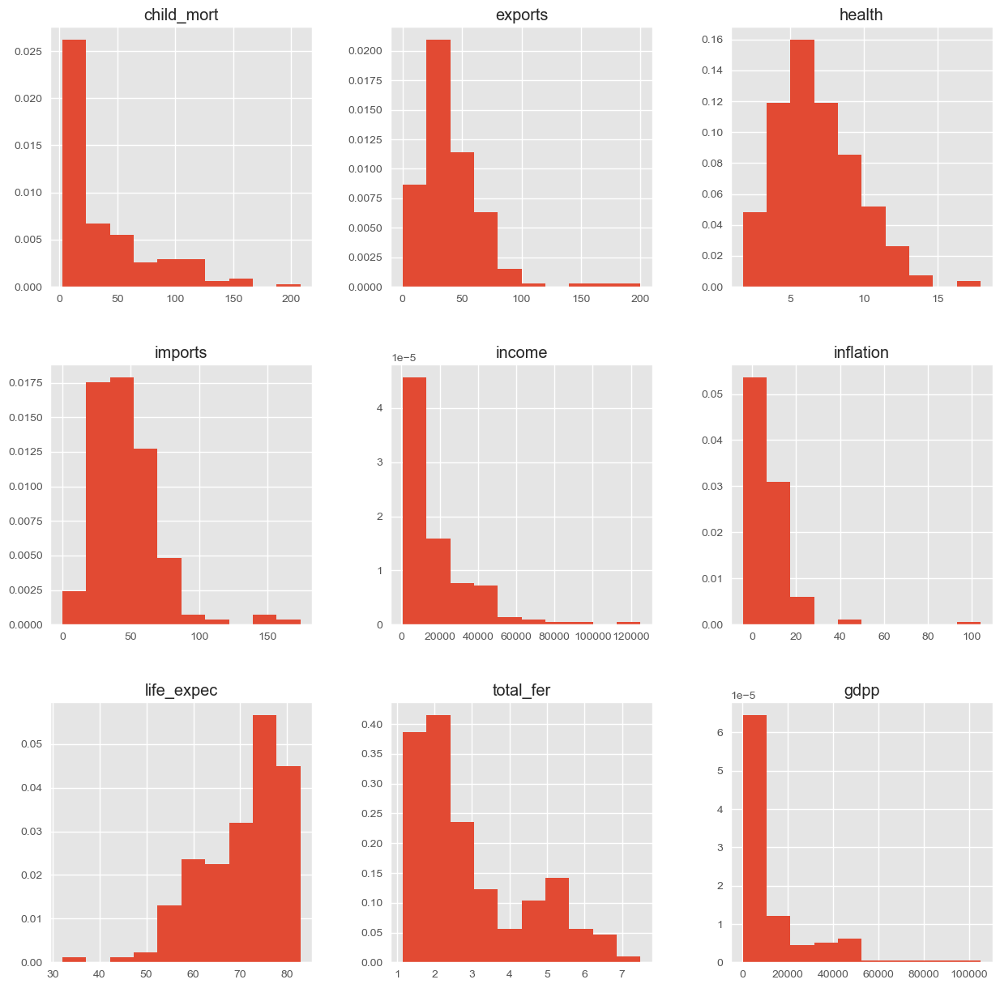

In [29]:
hs1 = df.drop('country',axis=1).hist(figsize=(15,15), density=True)
plt.show()

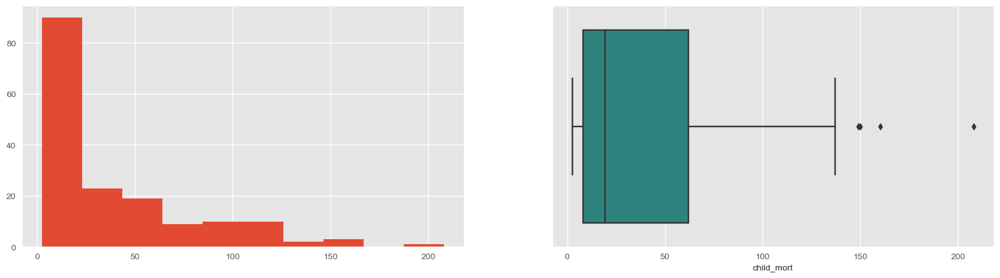

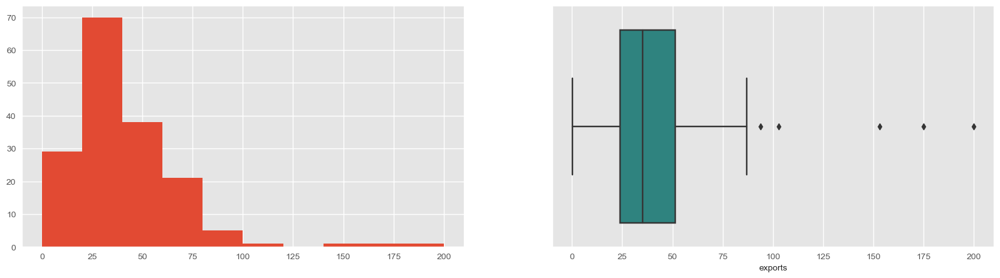

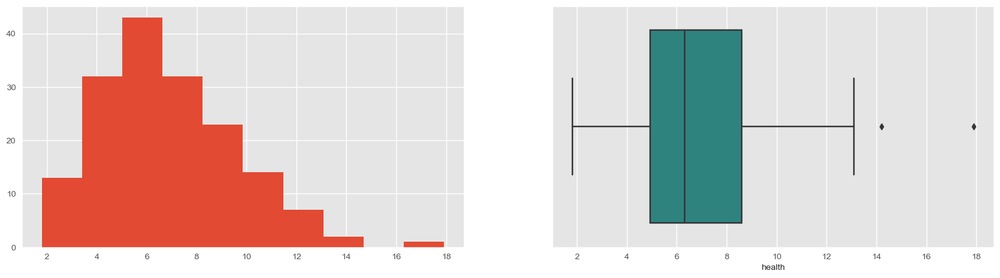

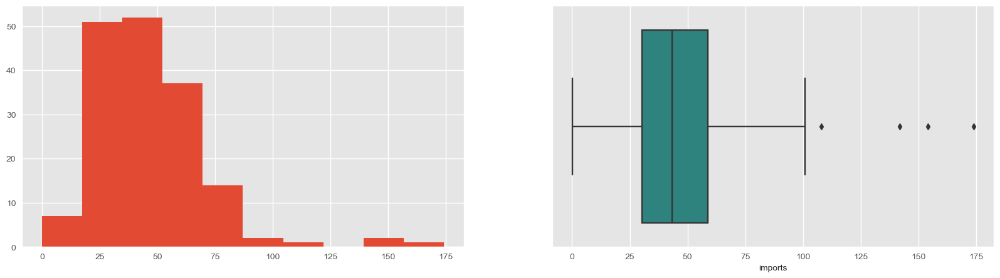

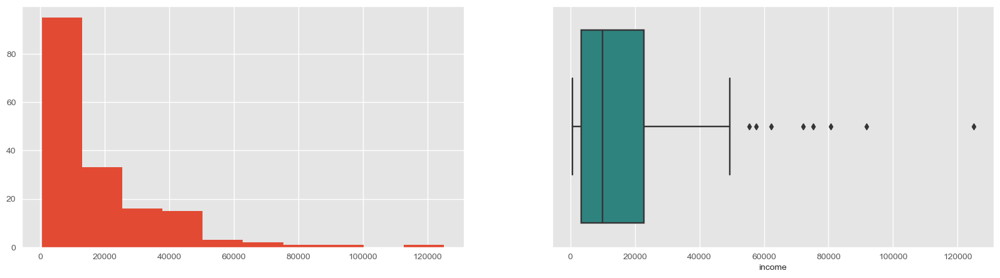

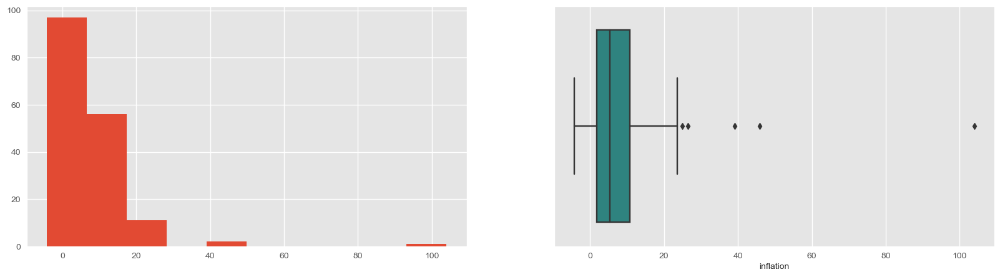

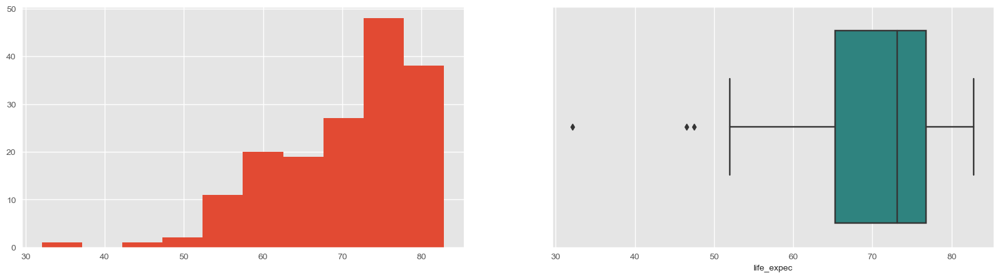

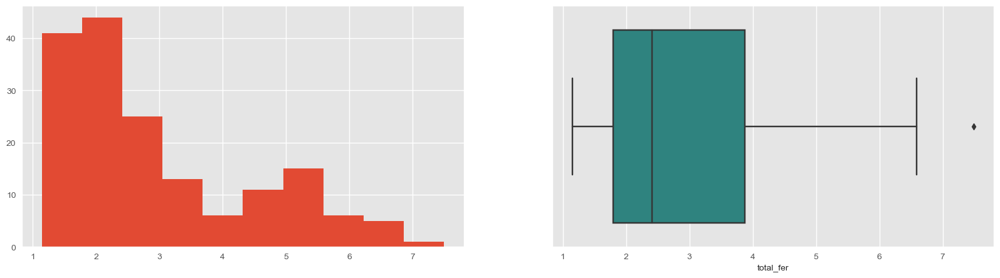

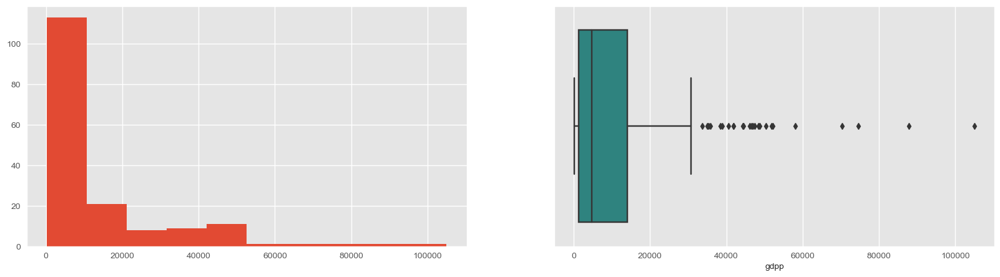

In [32]:
for col in df.drop('country',axis=1):
    fig, ax = plt.subplots(1, 2, figsize = (20, 5))
    df[col].hist(ax=ax[0])
    sns.boxplot(x = df[col], ax= ax[1], palette= 'viridis')
    sns.set_context()

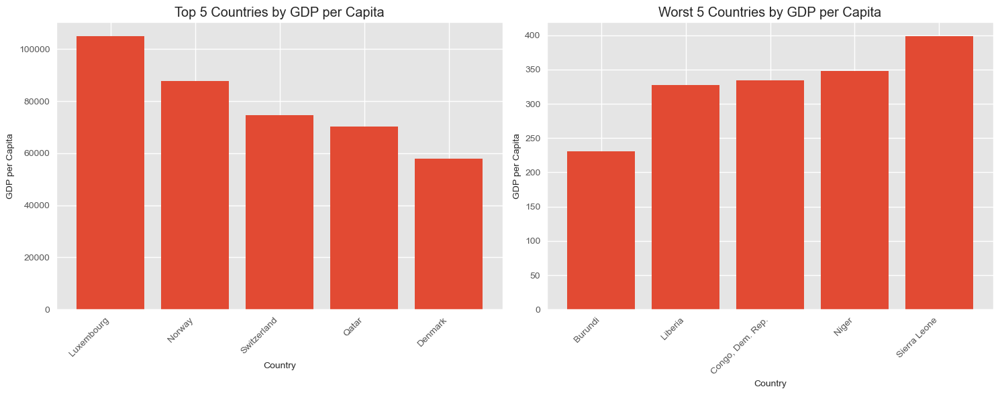

In [36]:
# Sort the DataFrame by gdpp in descending order to get the top 5 countries
top_5_countries = df.sort_values(by='gdpp', ascending=False).head(5)

# Sort the DataFrame by gdpp in ascending order to get the worst 5 countries
worst_5_countries = df.sort_values(by='gdpp', ascending=True).head(5)

# Create a subplot with 1 row and 2 columns
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Plot the top 5 countries
axes[0].bar(top_5_countries['country'], top_5_countries['gdpp'])
axes[0].set_title('Top 5 Countries by GDP per Capita')
axes[0].set_xlabel('Country')
axes[0].set_ylabel('GDP per Capita')

# Plot the worst 5 countries
axes[1].bar(worst_5_countries['country'], worst_5_countries['gdpp'])
axes[1].set_title('Worst 5 Countries by GDP per Capita')
axes[1].set_xlabel('Country')
axes[1].set_ylabel('GDP per Capita')

# Rotate the x-axis labels for better visibility
plt.setp(axes[0].get_xticklabels(), rotation=45, ha='right')
plt.setp(axes[1].get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### Check for top 10 affected countries per category

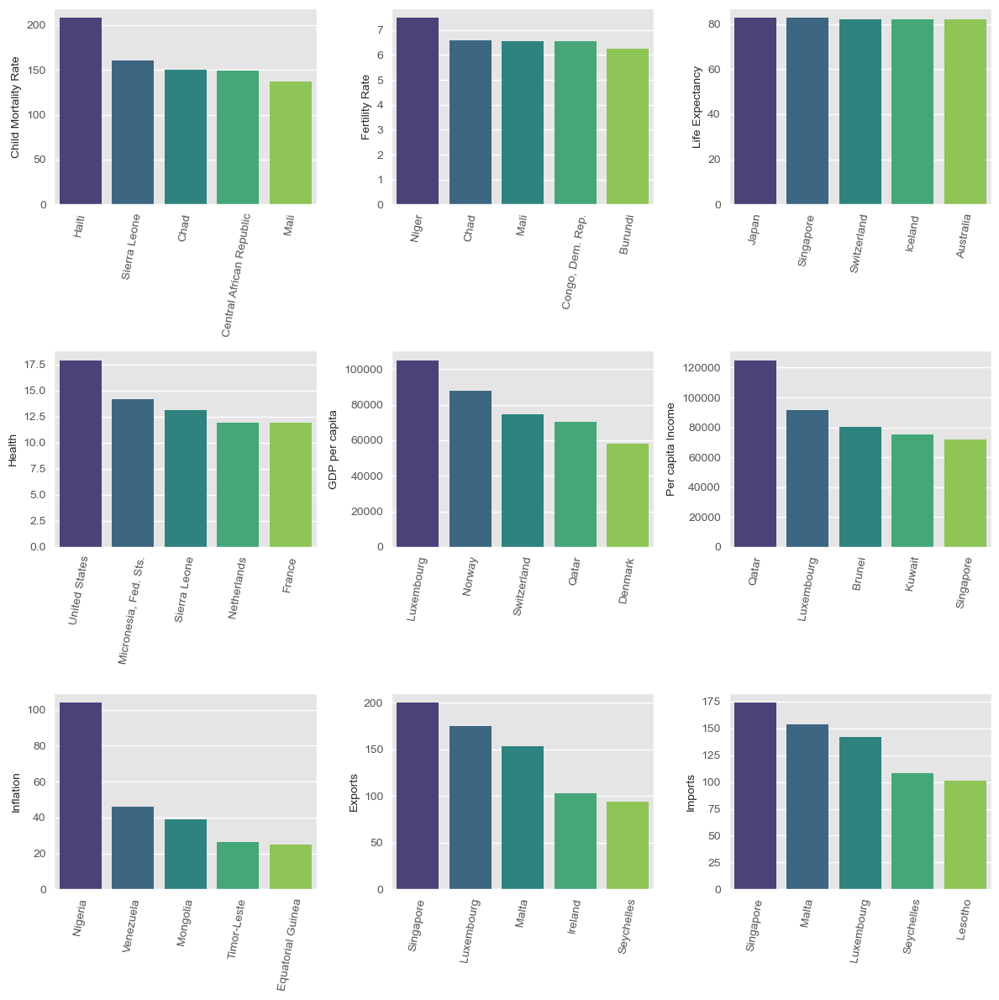

In [47]:
from matplotlib.cm import viridis

fig, axs = plt.subplots(3, 3, figsize=(12, 12))

# poor top 10 countries represented as `top10`

# Child Mortality Rate
top10_child_mort = df[['country', 'child_mort']].sort_values('child_mort', ascending=False).head()
plt1 = sns.barplot(x='country', y='child_mort', data=top10_child_mort, ax=axs[0, 0], palette='viridis')
plt1.set(xlabel='', ylabel='Child Mortality Rate')

# Exports
top10_exports = df[['country', 'exports']].sort_values('exports', ascending=False).head()
plt2 = sns.barplot(x='country', y='exports', data=top10_exports, ax=axs[2, 1], palette='viridis')
plt2.set(xlabel='', ylabel='Exports')

# Health
top10_health = df[['country', 'health']].sort_values('health', ascending=False).head()
plt3 = sns.barplot(x='country', y='health', data=top10_health, ax=axs[1, 0], palette='viridis')
plt3.set(xlabel='', ylabel='Health')

# Imports
top10_imports = df[['country', 'imports']].sort_values('imports', ascending=False).head()
plt4 = sns.barplot(x='country', y='imports', data=top10_imports, ax=axs[2, 2], palette='viridis')
plt4.set(xlabel='', ylabel='Imports')

# Per capita Income
top10_income = df[['country', 'income']].sort_values('income', ascending=False).head()
plt5 = sns.barplot(x='country', y='income', data=top10_income, ax=axs[1, 2], palette='viridis')
plt5.set(xlabel='', ylabel='Per capita Income')

# Inflation
top10_inflation = df[['country', 'inflation']].sort_values('inflation', ascending=False).head()
plt6 = sns.barplot(x='country', y='inflation', data=top10_inflation, ax=axs[2, 0], palette='viridis')
plt6.set(xlabel='', ylabel='Inflation')

# Fertility Rate
top10_total_fer = df[['country', 'total_fer']].sort_values('total_fer', ascending=False).head()
plt7 = sns.barplot(x='country', y='total_fer', data=top10_total_fer, ax=axs[0, 1], palette='viridis')
plt7.set(xlabel='', ylabel='Fertility Rate')

# Life Expectancy
top10_life_expec = df[['country', 'life_expec']].sort_values('life_expec', ascending=False).head()
plt8 = sns.barplot(x='country', y='life_expec', data=top10_life_expec, ax=axs[0, 2], palette='viridis')
plt8.set(xlabel='', ylabel='Life Expectancy')

# The GDP per capita
top10_gdpp = df[['country', 'gdpp']].sort_values('gdpp', ascending=False).head()
plt9 = sns.barplot(x='country', y='gdpp', data=top10_gdpp, ax=axs[1, 1], palette='viridis')
plt9.set(xlabel='', ylabel='GDP per capita')

for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=80)

plt.tight_layout()
# plt.savefig('eda')
plt.show()

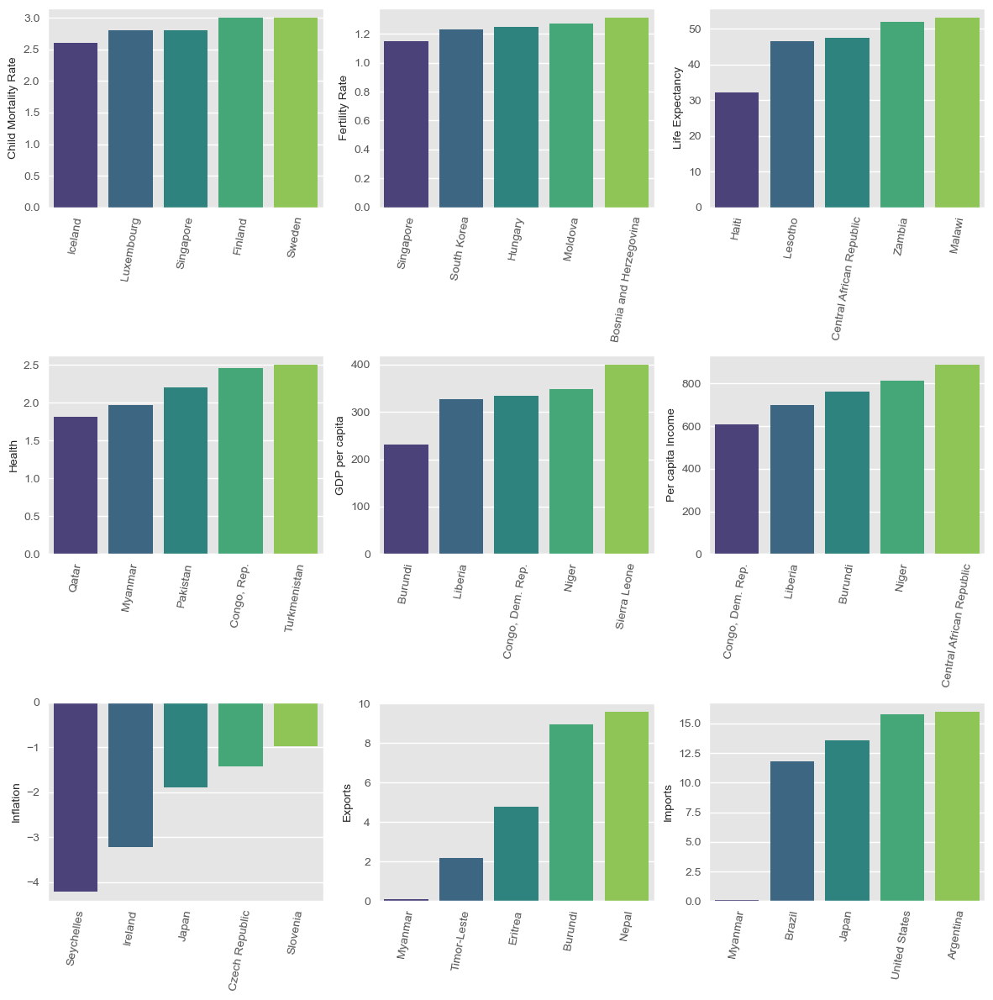

In [46]:
fig, axs = plt.subplots(3, 3, figsize=(12, 12))

# poor top 10 countries represented as `top10`

# Child Mortality Rate
top10_child_mort = df[['country', 'child_mort']].sort_values('child_mort', ascending=True).head()
plt1 = sns.barplot(x='country', y='child_mort', data=top10_child_mort, ax=axs[0, 0], palette='viridis')
plt1.set(xlabel='', ylabel='Child Mortality Rate')

# Exports
top10_exports = df[['country', 'exports']].sort_values('exports', ascending=True).head()
plt2 = sns.barplot(x='country', y='exports', data=top10_exports, ax=axs[2, 1], palette='viridis')
plt2.set(xlabel='', ylabel='Exports')

# Health
top10_health = df[['country', 'health']].sort_values('health', ascending=True).head()
plt3 = sns.barplot(x='country', y='health', data=top10_health, ax=axs[1, 0], palette='viridis')
plt3.set(xlabel='', ylabel='Health')

# Imports
top10_imports = df[['country', 'imports']].sort_values('imports', ascending=True).head()
plt4 = sns.barplot(x='country', y='imports', data=top10_imports, ax=axs[2, 2], palette='viridis')
plt4.set(xlabel='', ylabel='Imports')

# Per capita Income
top10_income = df[['country', 'income']].sort_values('income', ascending=True).head()
plt5 = sns.barplot(x='country', y='income', data=top10_income, ax=axs[1, 2], palette='viridis')
plt5.set(xlabel='', ylabel='Per capita Income')

# Inflation
top10_inflation = df[['country', 'inflation']].sort_values('inflation', ascending=True).head()
plt6 = sns.barplot(x='country', y='inflation', data=top10_inflation, ax=axs[2, 0], palette='viridis')
plt6.set(xlabel='', ylabel='Inflation')

# Fertility Rate
top10_total_fer = df[['country', 'total_fer']].sort_values('total_fer', ascending=True).head()
plt7 = sns.barplot(x='country', y='total_fer', data=top10_total_fer, ax=axs[0, 1], palette='viridis')
plt7.set(xlabel='', ylabel='Fertility Rate')

# Life Expectancy
top10_life_expec = df[['country', 'life_expec']].sort_values('life_expec', ascending=True).head()
plt8 = sns.barplot(x='country', y='life_expec', data=top10_life_expec, ax=axs[0, 2], palette='viridis')
plt8.set(xlabel='', ylabel='Life Expectancy')

# The GDP per capita
top10_gdpp = df[['country', 'gdpp']].sort_values('gdpp', ascending=True).head()
plt9 = sns.barplot(x='country', y='gdpp', data=top10_gdpp, ax=axs[1, 1], palette='viridis')
plt9.set(xlabel='', ylabel='GDP per capita')

for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=80)

plt.tight_layout()
# plt.savefig('eda')
plt.show()

## Data Scaling

In [33]:
X_prescaled = df.drop(columns=['country'])

In [35]:
ss = StandardScaler()

'''fit scaler on numeric features'''
ss.fit(X_prescaled)

'''scale numeric features now'''
X = ss.transform(X_prescaled)

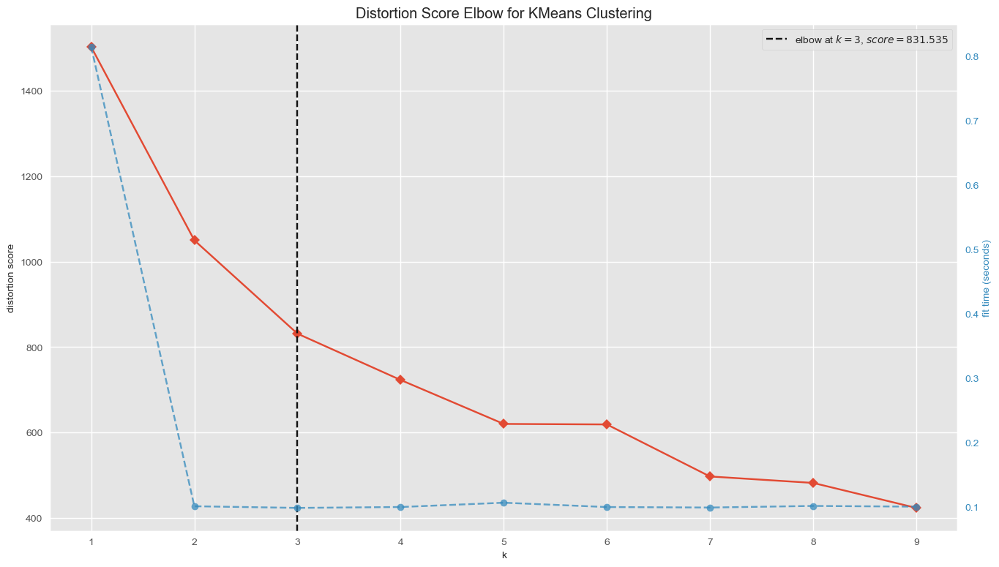

In [41]:
# Instantiate the clustering model and visualizer
model = KMeans(n_init='auto')
visualizer = KElbowVisualizer(model, k=(1,10), locate_elbow=True)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.poof()        # Draw/show/poof the data
plt.show()

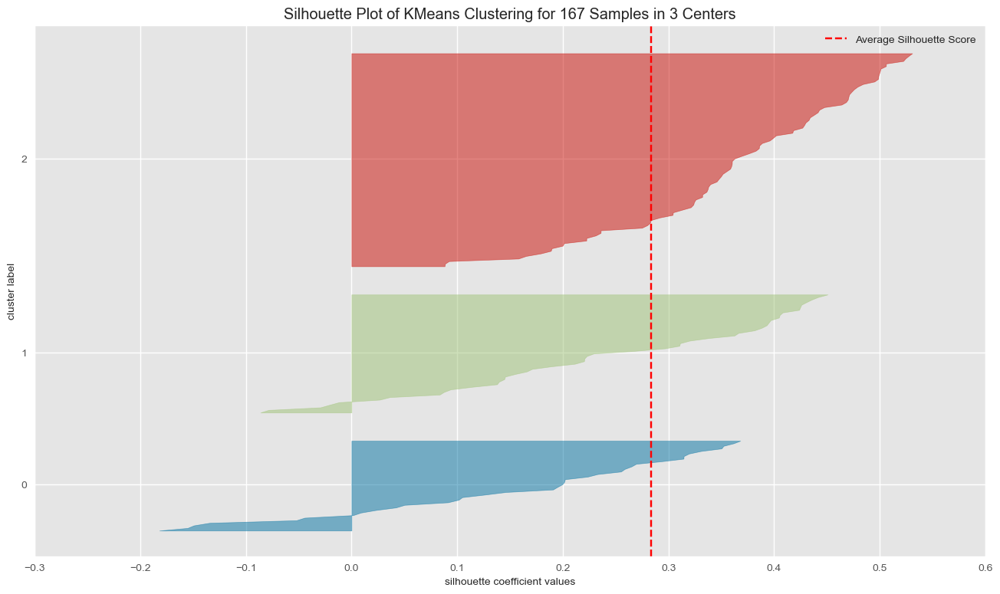

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 167 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [42]:
# Instantiate the clustering model and visualizer
model = KMeans(3, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.poof()        # Draw/show/poof the data

----------------------------------------------------------------------
For n_clusters = 2 The average silhouette_score is : 0.28735668921406704


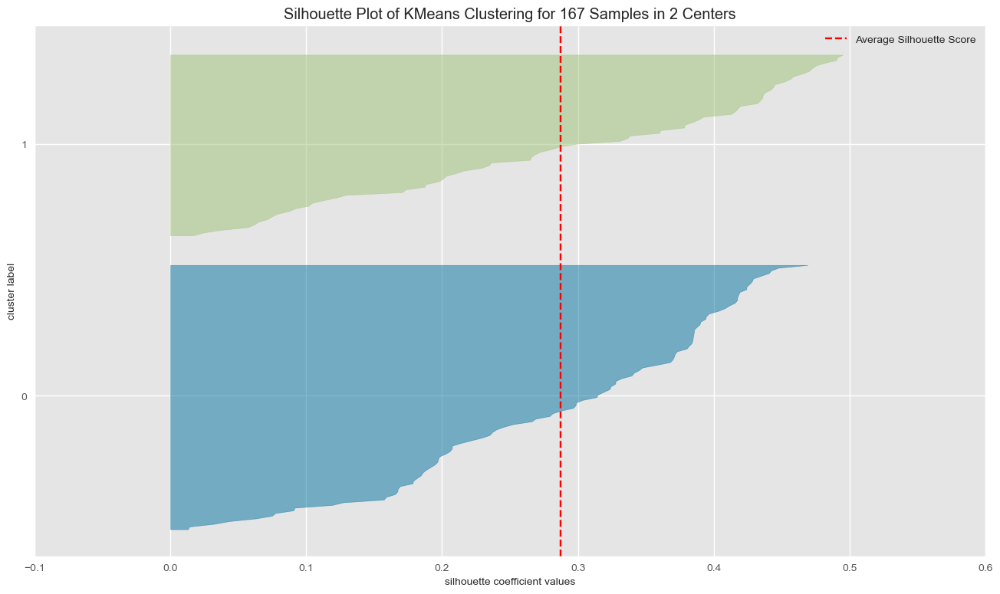

----------------------------------------------------------------------
For n_clusters = 3 The average silhouette_score is : 0.28329575683463126


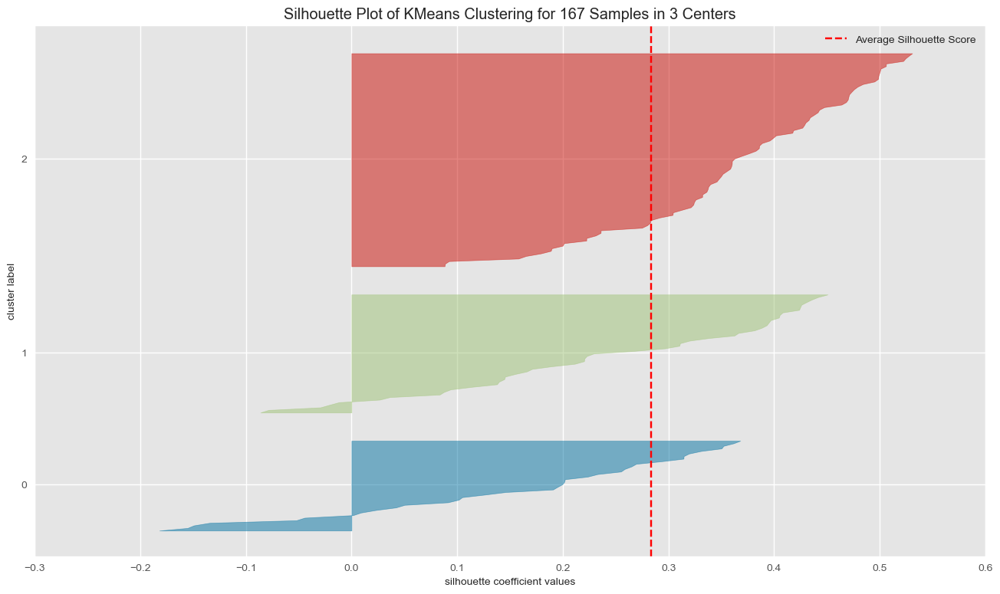

----------------------------------------------------------------------
For n_clusters = 4 The average silhouette_score is : 0.301375962376881


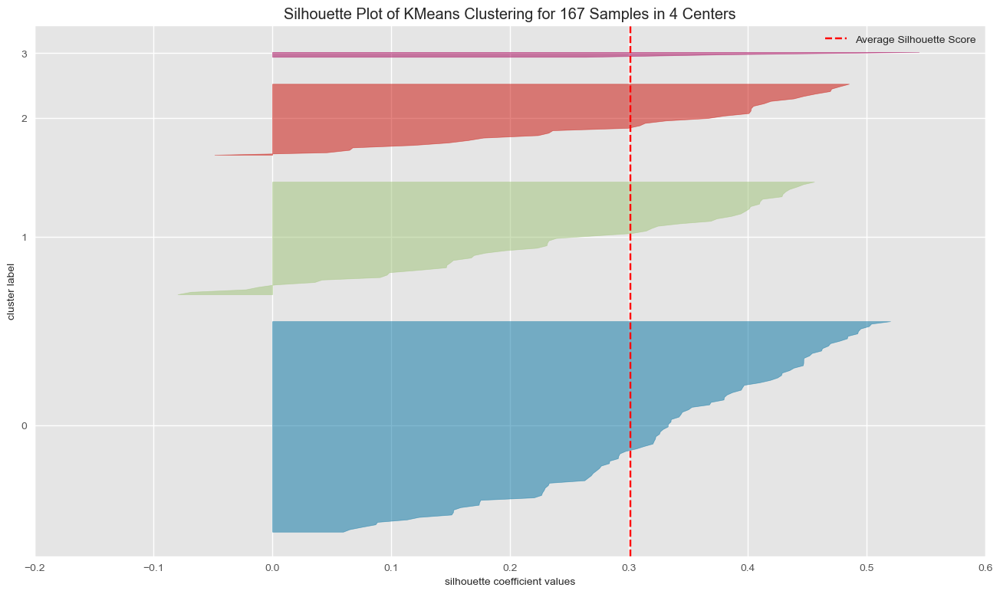

----------------------------------------------------------------------
For n_clusters = 5 The average silhouette_score is : 0.2992594995920442


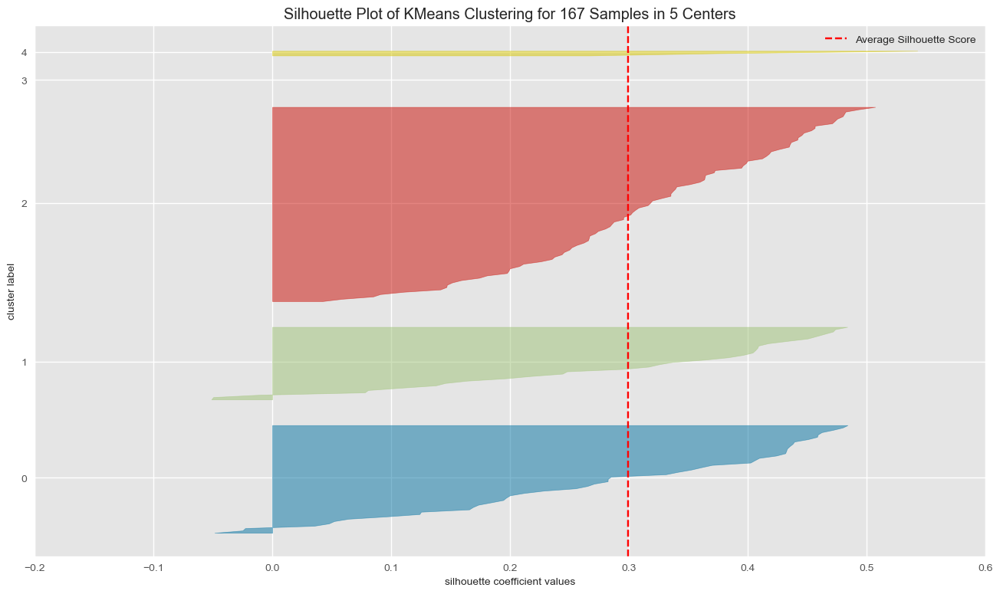

----------------------------------------------------------------------
For n_clusters = 6 The average silhouette_score is : 0.2350698927516289


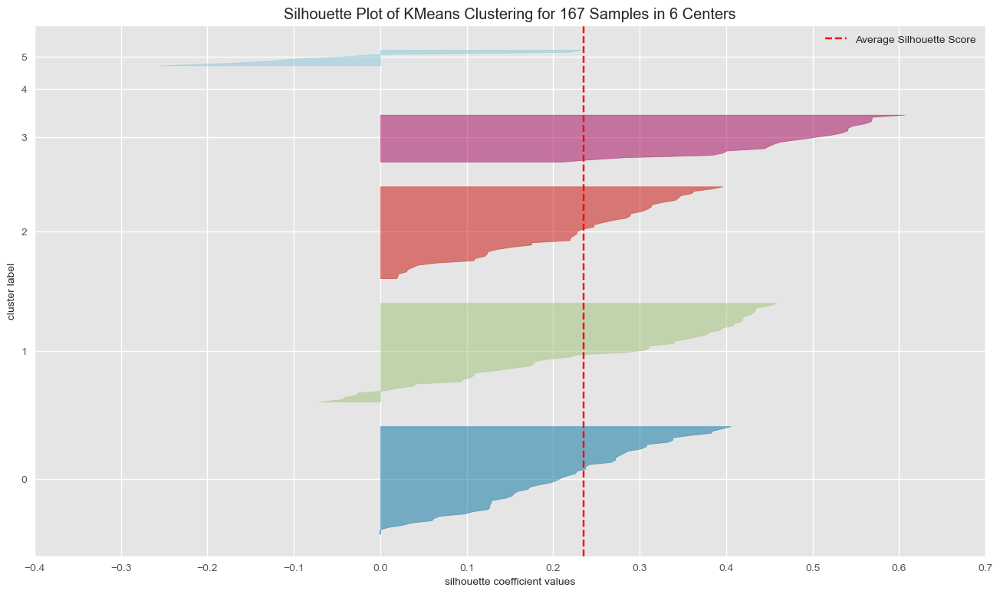

----------------------------------------------------------------------
For n_clusters = 7 The average silhouette_score is : 0.24905003461730515


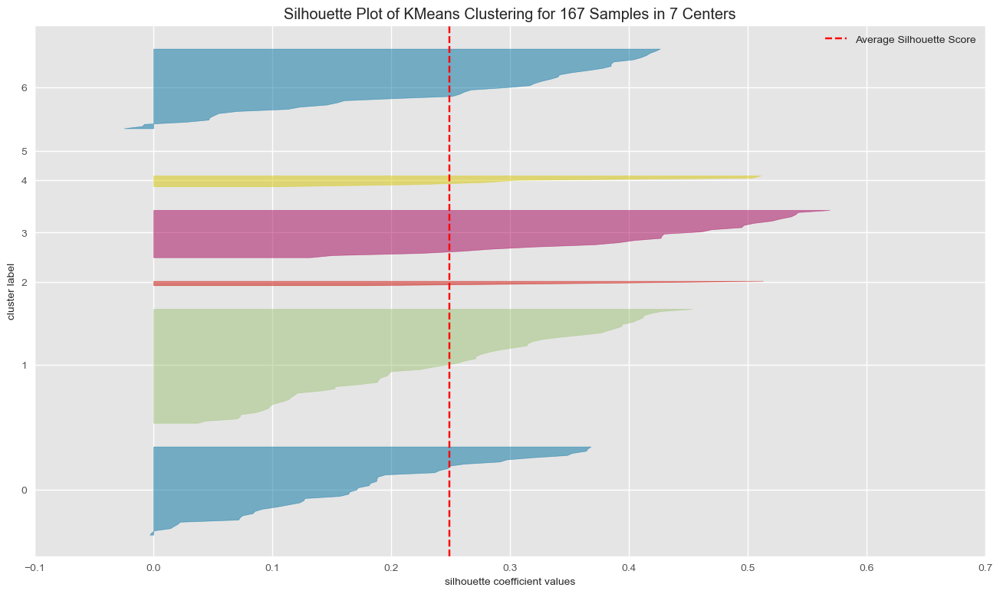

In [43]:
search_name = 'kmeans'

n_clusters = np.arange(2,8,1).tolist()

for n_clusters in n_clusters:
    
    print('-'*70)
    
    model = KMeans()

    param_dict = {'n_clusters': n_clusters,
                  'n_init': 10,
                  'random_state':42,
                 'algorithm':'auto'
                 }

    model.set_params(**param_dict)
    labels = model.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(X)        # Fit the data to the visualizer
    visualizer.poof()